### Taller 1
__Tema:__ Estimación de modelos ARMA y elaboración de pronósticos.<br />
__Instrucciones:__ Usaremos Stata y emplearemos la base de datos *macrodata.csv*.

#### <font color=navy> Comandos iniciales  </font> 

In [1]:
*Cargar la base de datos
clear all                   
set more off, permanently      
set matsize 800

cd "C:\Users\Némesis\OneDrive - Escuela Superior Politécnica del Litoral\CIEC\TD ECOIII\PAO I 2020\Cursos\Paralelo 102\ECOG2046\Sesión5 Taller1 (16junio)"
import delimited "macrodata.csv", varnames(1) clear
describe



(set more preference recorded)


C:\Users\Némesis\OneDrive - Escuela Superior Politécnica del Litoral\CIEC\TD ECO
> III\PAO I 2020\Cursos\Paralelo 102\ECOG2046\Sesión5 Taller1 (16junio)

(14 vars, 203 obs)


Contains data
  obs:           203                          
 vars:            14                          
 size:        10,353                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
quarter         byte    %8.0g                 
realgdp         float   %9.0g                 
realcons        float   %9.0g                 
realinv         float   %9.0g                 
realgovt        float   %9.0g                 
realdpi         float   %9.0g                 
cpi             float   %9.0g             

In [2]:
list year quarter infl in 1/5, table
list year quarter infl in 200/203, table



     +-----------------------+
     | year   quarter   infl |
     |-----------------------|
  1. | 1959         1      0 |
  2. | 1959         2   2.34 |
  3. | 1959         3   2.74 |
  4. | 1959         4    .27 |
  5. | 1960         1   2.31 |
     +-----------------------+


     +------------------------+
     | year   quarter    infl |
     |------------------------|
200. | 2008         4   -8.79 |
201. | 2009         1     .94 |
202. | 2009         2    3.37 |
203. | 2009         3    3.56 |
     +------------------------+


In [3]:
*Generar la variable tiempo
*Debemos indicarle a stata la frecuencia de la base: diaria, semanal, trimestral o anual.

generate time =q(1959q1) + _n-1     // Informacion trimestral, 1959q1 en adelante.
format time %tq                     // formatea la variable como una serie de tiempo
tsset time                          // Tell Stata which is your time reference variable
*drop year

/* Other options:
yearly: gen time = y(1994)+_n-1
format time %ty
semester: gen time=h(1994h1)+_n-1
format time %th
monthly: gen time=m(1994m1)+_n-1
format time %tm
weekly: gen time=w(1994w1)+_n-1
format time %tw
daily: gen time=d(1jan1994)+_n-1
format time %td
*/




        time variable:  time, 1959q1 to 2009q3
                delta:  1 quarter


In [4]:
*Etiquetar las variables que utilizaremos
label variable time "Time"
label variable infl "Inflación US"
describe





Contains data
  obs:           203                          
 vars:            15                          
 size:        11,165                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
quarter         byte    %8.0g                 
realgdp         float   %9.0g                 
realcons        float   %9.0g                 
realinv         float   %9.0g                 
realgovt        float   %9.0g                 
realdpi         float   %9.0g                 
cpi             float   %9.0g                 
m1              float   %9.0g                 
tbilrate        float   %9.0g                 
unemp           float   %9.0g                 
pop             float   %9.0g                 
infl         

#### <font color=maroon> Preguntas</font>
#### <font color=navy> 1. Gráfico de la variable de inflación</font>

__a)__ Grafique la variable de inflación. En las figuras se debe apreciar: título de ejes y su numeración, leyenda, y titulo del grafico.

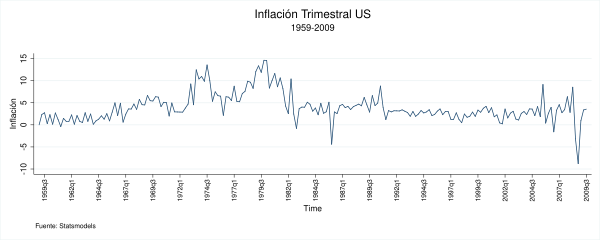

In [5]:
tsline infl, yti("Inflación", height(4)) ///
title("Inflación Trimestral US", color(black)) ///
subtitle("1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) graphregion(fcolor(white)) ///
xsize(15) ysize(6) xlabel(#20,labsize(small) angle(vertical)) 


__b)__ Comente dos hechos de la economía que puedan sugerir el por qué las subidas o caídas que se observa en la serie. Agregue en las figuras líneas verticale en la fechas de esos eventos. Use diferentes colores para cada evento muestre su leyenda.

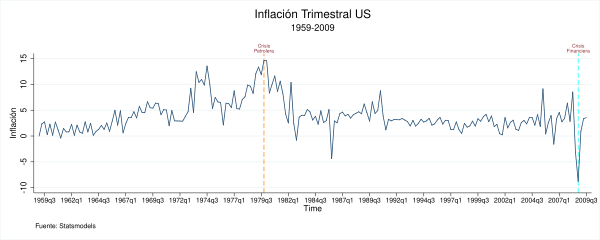

In [6]:
tsline infl, yti("Inflación", height(4)) ///
title("Inflación Trimestral US", color(black)) ///
subtitle("1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) graphregion(fcolor(white)) ///
xsize(15) ysize(6) xlabel(#20,labsize(small)) ///
tline(2008q4, lp(dash) lc(cyan)) tline(1979q4, lp(dash) lc(orange)) ///
ttext(17 2008q4 "Crisis" "Financiera", color(maroon) size(vsmall) orient(hor)) ///
ttext(17 1979q4 "Crisis" "Petrolera", color(maroon) size(vsmall) orient(hor))


#### <font color=navy> 2. ACF y PACF </font>

__a)__ Calcule el ACF y PACF para la serie de inflación de US. Qué tipo de proceso ARMA(p;q) parece ajustarse mejor al ACF / PACF? Explica tu razonamiento.

In [7]:
//Correlogram
*Lags: número de rezagos en que evalúo la serie.
corrgram infl, lags(20) 


                                          -1       0       1 -1       0       1
 LAG       AC       PAC      Q     Prob>Q  [Autocorrelation]  [Partial Autocor]
-------------------------------------------------------------------------------
1        0.6425   0.6425   85.033  0.0000          |-----             |-----   
2        0.5953   0.3108   158.41  0.0000          |----              |--      
3        0.6160   0.2908   237.37  0.0000          |----              |--      
4        0.4927  -0.0265   288.13  0.0000          |---               |        
5        0.4819   0.0789   336.95  0.0000          |---               |        
6        0.4492   0.0178   379.56  0.0000          |---               |        
7        0.3943  -0.0067   412.58  0.0000          |---               |        
8        0.3247  -0.1453   435.08  0.0000          |--               -|        
9        0.3498   0.1224   461.32  0.0000          |--                |        
10       0.2828  -0.0354   478.56  0.00

Se observa autocorrelación por lo menos hasta el décimo rezago y autocorrelación parcial hasta el tercer rezago. La serie no es estacionaria debido a que existe una alta correlación.
Si queremos modelar esta serie y realizar pronósticos debemos incluir en nuestro modelo los momentos relevantes de acuerdo con el análisis de autocorrelación.

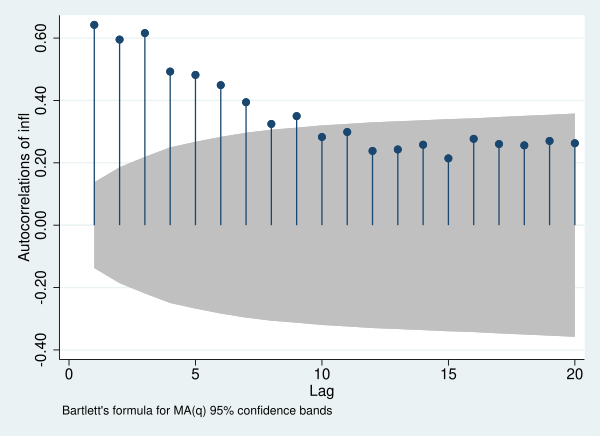

In [8]:
// Intervalos de confianza para la FAC (MA)
ac infl, lags(20)   

Si queremos estimar un modelo de media móvil debemos incluir por lo menos 9 rezagos.
Se observa un patron decreciente que es evidencia de que existe autocorrelación por lo menos hasta el 9 rezago. Estos rezagos capturan información relevante para el modelo que queremos construir.

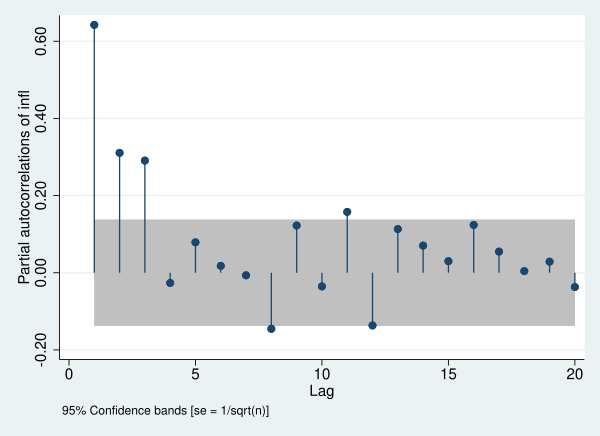

In [9]:
// Intervalos de confianza para la PAC (AR)
pac infl, lags(20)  

Si queremos estimar un modelo autorregresivo debemos considerar los tres primeros rezagos. Existe autocorrelación en ese período.



Cumulative periodogram white-noise test
---------------------------------------
 Bartlett's (B) statistic  =     5.7137
 Prob > B                  =     0.0000


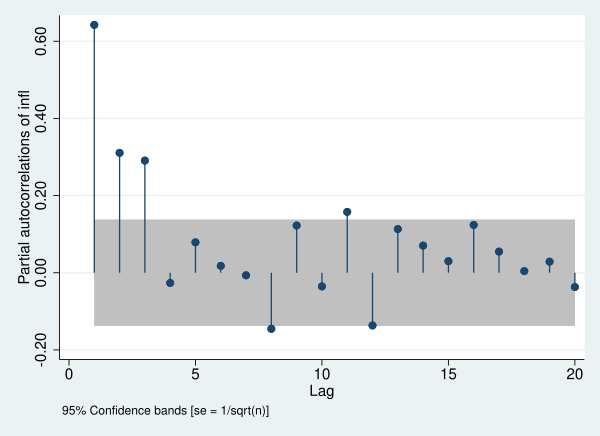

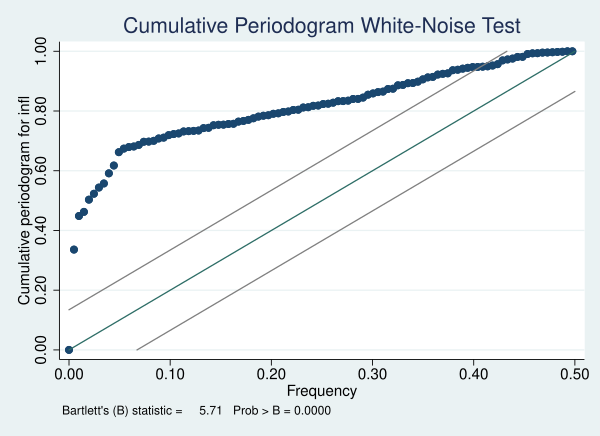






Portmanteau test for white noise
---------------------------------------
 Portmanteau (Q) statistic =   478.5638
 Prob > chi2(10)           =     0.0000


In [10]:
//Test de ruido blanco. Test de Portmanteau y Bartlet: Q test. 
*Ho: las autocorrelaciones son cero.
wntestb infl, table
wntestb infl
wntestq infl, lags(10)
*No hay probabilidad de que se cumpla la Ho.
*La variable no es ruido blanco, y por ende no es estacionaria.

#### <font color=navy> 4. Estimación ARMA </font>

__a)__ Usando el loop visto en clase para seleccionar modelos ARMA, indique qué combinación de p y q sugieren los criterios de información AIC, BIC, y HQIC.

__b)__ Estime el proceso ARMA sugerido en el literal previo e informe sus resultados.

__c)__ Realice el dignóstico del modelo estimado: 
muestre y comente el qqplot de los residuos, estime y comente los ACF y PACF de los residuos, 
obtenga y comente la prueba de normalidad, y obtenga y comente el test de durbin-watson a los residuos. Son los residuos estacionarios?.

__d)__ Realice un pronóstico para los siguiente 5 períodos, junto con sus intervalos de confianza. Grafique dichos pronósticos.

__Modelo de media móvil (MA)__

In [11]:
//Estimamos el modelo según el análisis realizado con la FAC y PAC.
arima infl, ma (1/9) 
*Se puede incorporar la tendencia en la seccion estructural 
*y se deja el analisis estocastico exclusivamente en los errores.


(setting optimization to BHHH)
Iteration 0:   log likelihood = -458.50119  
Iteration 1:   log likelihood = -455.39265  
Iteration 2:   log likelihood = -452.72105  
Iteration 3:   log likelihood = -451.92684  
Iteration 4:   log likelihood = -451.82123  
(switching optimization to BFGS)
Iteration 5:   log likelihood = -451.50093  
Iteration 6:   log likelihood = -451.09713  
Iteration 7:   log likelihood = -451.08874  
Iteration 8:   log likelihood = -451.08451  
Iteration 9:   log likelihood =  -451.0834  
Iteration 10:  log likelihood = -451.08279  
Iteration 11:  log likelihood = -451.08273  
Iteration 12:  log likelihood = -451.08271  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(9)      =     129.20
Log likelihood = -451.0827                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |



(setting optimization to BHHH)
Iteration 0:   log likelihood = -461.89624  
Iteration 1:   log likelihood = -457.29577  
Iteration 2:   log likelihood = -455.44865  
Iteration 3:   log likelihood = -454.22346  
Iteration 4:   log likelihood = -453.85284  
(switching optimization to BFGS)
Iteration 5:   log likelihood = -453.68323  
Iteration 6:   log likelihood = -453.51292  
Iteration 7:   log likelihood = -453.50978  
Iteration 8:   log likelihood = -453.49463  
Iteration 9:   log likelihood = -453.49314  
Iteration 10:  log likelihood = -453.49221  
Iteration 11:  log likelihood = -453.49203  
Iteration 12:  log likelihood = -453.49201  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(7)      =     159.94
Log likelihood =  -453.492                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             

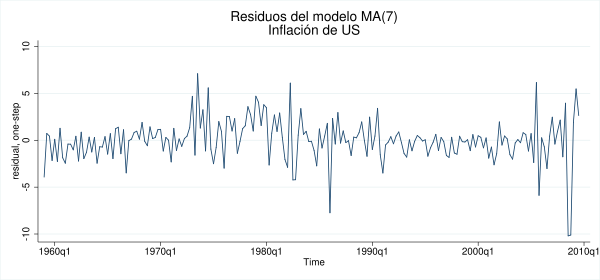






                                          -1       0       1 -1       0       1
 LAG       AC       PAC      Q     Prob>Q  [Autocorrelation]  [Partial Autocor]
-------------------------------------------------------------------------------
1       -0.0073  -0.0073   .01091  0.9168          |                  |        
2        0.0174   0.0181    .0737  0.9638          |                  |        
3        0.0301   0.0322   .26163  0.9671          |                  |        
4        0.0447   0.0512   .67992  0.9538          |                  |        
5        0.0344   0.0506   .92802  0.9682          |                  |        
6        0.0630   0.0790   1.7666  0.9399          |                  |        
7        0.0582   0.0773   2.4846  0.9283          |                  |        
8        0.0584   0.0678   3.2126  0.9203          |                  |        
9        0.1466   0.1906   7.8243  0.5519          |-                 |-       
10       0.0135   0.0141   7.8635  

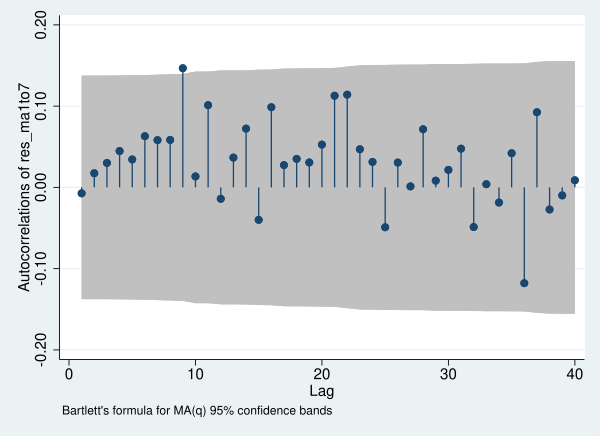

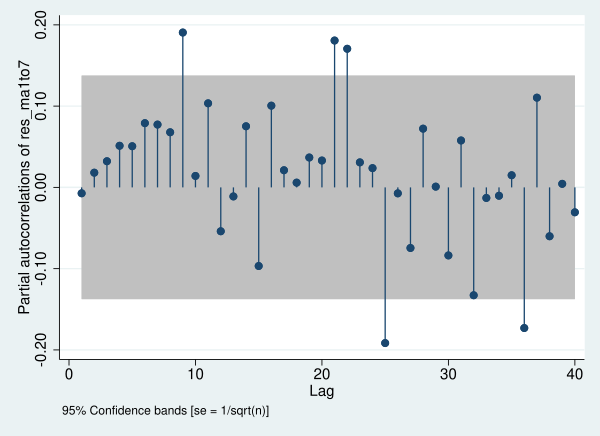

In [12]:
//Podemos probar otra especificación
arima infl, ma(1/7)

//Estimacion de los residuos
predict res_ma1to7, resid  

//Gráfico de los residuos
tsline res_ma1to7, title("Residuos del modelo MA(7)" "Inflación de US", color(black))  ///
graphregion(fcolor(white)) xsize(15) ysize(7)

//Analisis de los residuos 
corrgram res_ma1to7, lags(20)        //No hay autocorrelacion. Estructura aparentemente suficiente.
ac res_ma1to7                        //Niveles dentro del intervalo.
pac res_ma1to7
   

__Test de normalidaad y test de ruido blanco para los residuos__ <br />

__D'Agostino et al. 1990, test de normalidad (equivalente al de JARQUE BERA)__ <br />
H0: Los errores se distribuyen normalmente.
Si el valor obtenido es menor que 0.05 se rechaza la Ho. 
En este caso el valor es 0, por lo tanto se rechaza la Ho y se puede decir que los errores no se distribuyen normalmente.


In [13]:
sktest res_ma1to7


                    Skewness/Kurtosis tests for Normality
                                                          ------ joint ------
    Variable |        Obs  Pr(Skewness)  Pr(Kurtosis) adj chi2(2)   Prob>chi2
-------------+---------------------------------------------------------------
  res_ma1to7 |        203     0.0007        0.0000       29.52         0.0000


__Test de ruido blanco__ <br />
Ho: No hay autocorrelación. <br />
Prob. del 82% de que los residuos sean ruido blanco. El valor es mayor que 0,05, por lo que no se rechaza la Ho. Con estas pruebas se puede determinar que la estructura planteada funciona de manera adecuada.

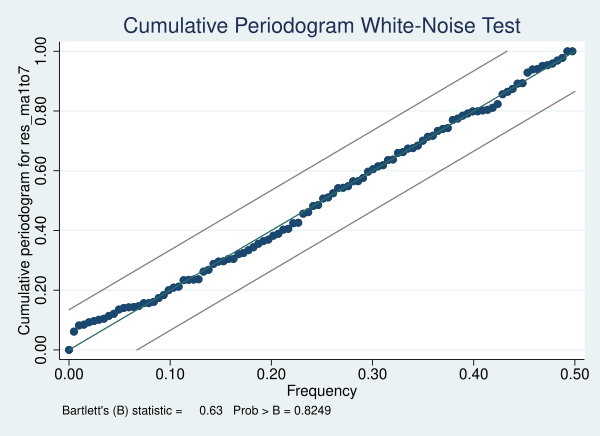

In [14]:
wntestb res_ma1to7 

__Estimación iterativa para varios modelos MA__



ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(1)      =     154.18
Log likelihood = -493.9984                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.954363   .2963037    13.35   0.000     3.373619    4.535108
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4994353   .0402223    12.42   0.000      .420601    .5782695
-------------+----------------------------------------------------------------
      /sigma |   2.756229   .0969212    28.44   0.000     2.566267     2.94619
------------------------------

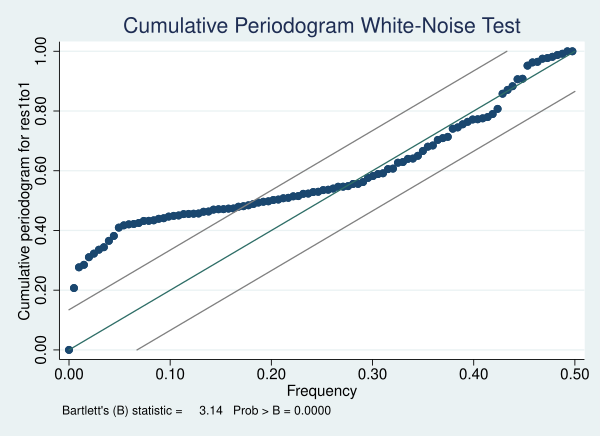


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(2)      =      80.97
Log likelihood = -487.2771                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.943944   .3262929    12.09   0.000     3.304421    4.583466
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4473888     .05062     8.84   0.000     .3481755    .5466021
         L2. |   .2438208   .0672979     3.62   0.000     .1119193    .3757223
-------------+----------------------------------------------------------------
      /sigma |   2.666401   .09

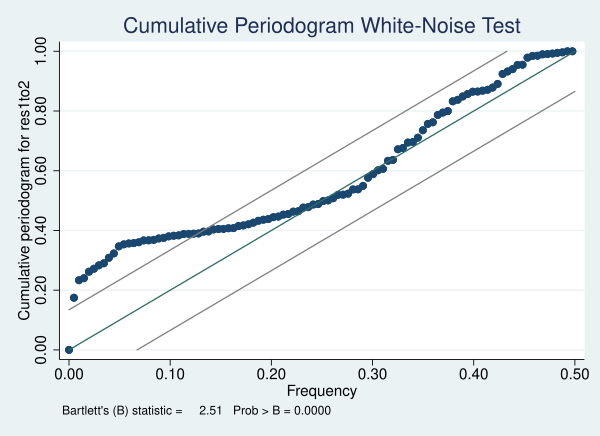


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(3)      =     180.12
Log likelihood = -467.4388                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.970876   .3958349    10.03   0.000     3.195054    4.746698
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4741352   .0451138    10.51   0.000     .3857137    .5625566
         L2. |   .3408002   .0692971     4.92   0.000     .2049803    .4766201
         L3. |   .4384554   .0541159     8.10   0.000     .3323902    .5445206
-------------+-----------------

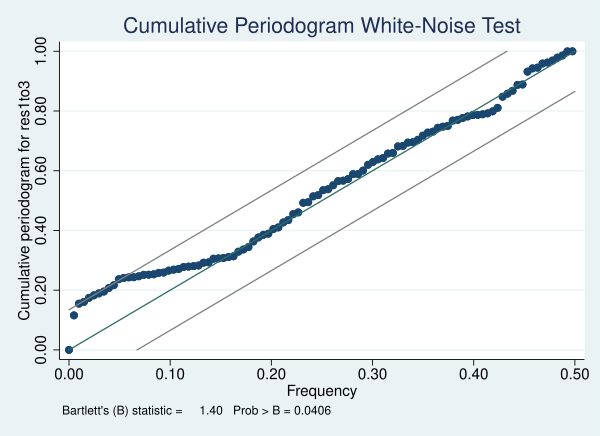


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(4)      =     172.26
Log likelihood = -466.5961                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.975226   .4262137     9.33   0.000     3.139862    4.810589
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4717547   .0464012    10.17   0.000     .3808101    .5626994
         L2. |   .3459228   .0681557     5.08   0.000     .2123402    .4795055
         L3. |   .4409025   .0631737     6.98   0.000     .3170843    .5647207
         L4. |    .102533   .07

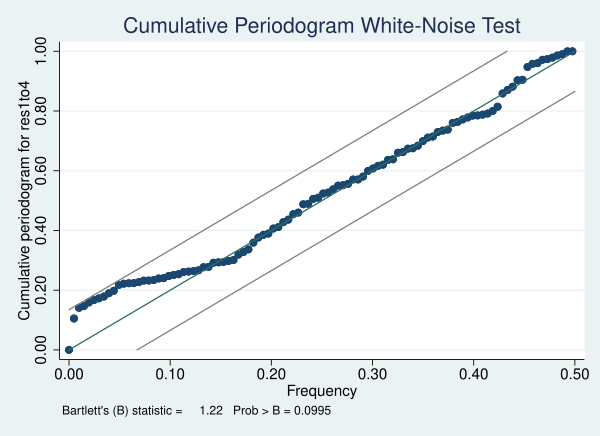


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(5)      =     130.16
Log likelihood = -460.6657                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.960863   .4503911     8.79   0.000     3.078113    4.843613
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4080651   .0512786     7.96   0.000     .3075609    .5085692
         L2. |   .2837471   .0664313     4.27   0.000     .1535442    .4139499
         L3. |   .4733923    .063639     7.44   0.000     .3486621    .5981225
         L4. |   .2124892   .07

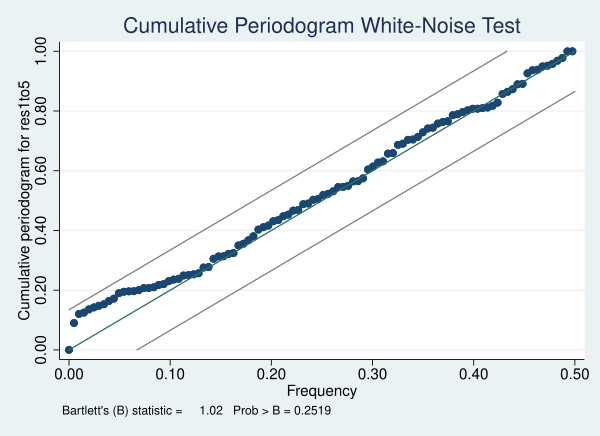


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(6)      =     177.54
Log likelihood = -458.2752                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.953113    .507589     7.79   0.000     2.958256    4.947969
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .3875622   .0462333     8.38   0.000     .2969466    .4781778
         L2. |   .3012035   .0724596     4.16   0.000     .1591852    .4432217
         L3. |   .5006513   .0583993     8.57   0.000     .3861907    .6151118
         L4. |    .169832   .07

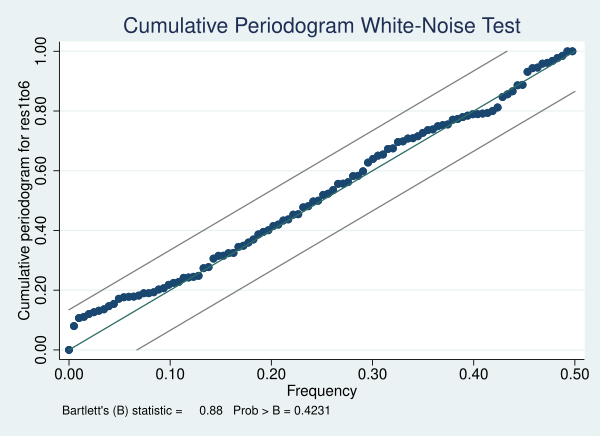


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(7)      =     159.94
Log likelihood =  -453.492                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.925051   .6340239     6.19   0.000     2.682387    5.167715
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4208142   .0482554     8.72   0.000     .3262354     .515393
         L2. |   .3084939   .0739364     4.17   0.000     .1635812    .4534066
         L3. |   .4817498   .0578858     8.32   0.000     .3682956     .595204
         L4. |   .2389996   .08

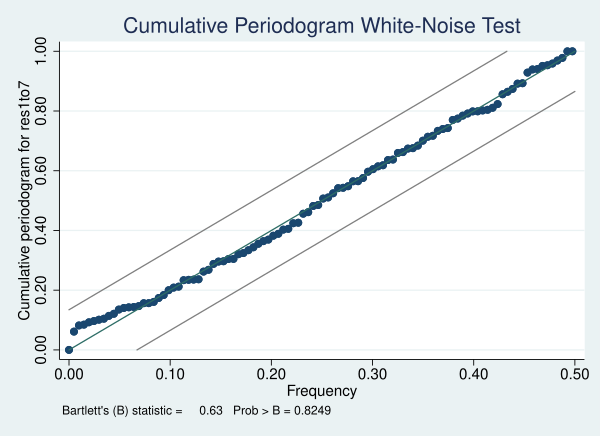


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(8)      =     155.71
Log likelihood = -453.4277                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.926241   .6259138     6.27   0.000     2.699473     5.15301
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4224168   .0482636     8.75   0.000     .3278219    .5170117
         L2. |   .3052128   .0742938     4.11   0.000     .1595996    .4508259
         L3. |   .4764591   .0594267     8.02   0.000     .3599849    .5929332
         L4. |   .2387581   .08

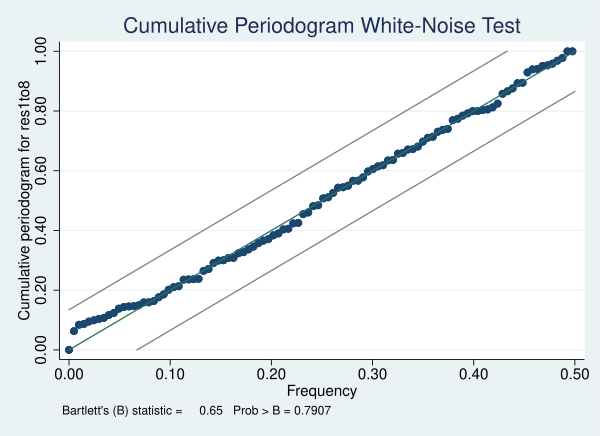


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(9)      =     129.20
Log likelihood = -451.0827                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.912543   .6246296     6.26   0.000     2.688291    5.136794
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4171959   .0443534     9.41   0.000     .3302649    .5041268
         L2. |   .2941238   .0721341     4.08   0.000     .1527436    .4355039
         L3. |    .477309   .0620037     7.70   0.000     .3557841    .5988339
         L4. |   .2555972   .07

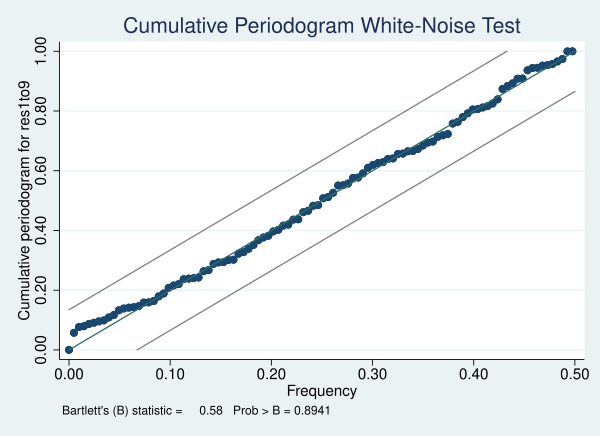


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(10)     =     129.46
Log likelihood = -450.8706                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.901477   .6340253     6.15   0.000     2.658811    5.144144
-------------+----------------------------------------------------------------
ARMA         |
          ma |
         L1. |   .4035495   .0451657     8.93   0.000     .3150265    .4920726
         L2. |   .2712381   .0754538     3.59   0.000     .1233514    .4191248
         L3. |   .4736219   .0636363     7.44   0.000     .3488971    .5983467
         L4. |   .2449107   .07

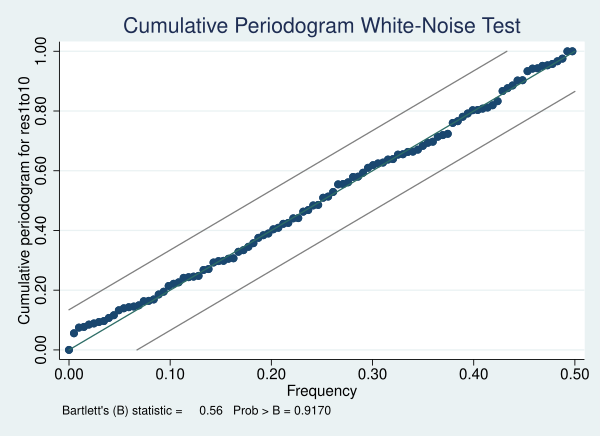

In [21]:
forvalues i=1(1)10{
eststo modelo_ma`i': arima infl, ma(1/`i') nolog     //within sample prediction
predict MAprediction_1to`i'
predict res1to`i', resid
wntestb res1to`i'
//corrgram res1to`i', lags(20)
//ac res1to`i'
}

* A partir del modelo MA(4) los errores son ruido blanco.


In [22]:
//Análisis de los residuos y criterios de información para seleccionar el modelo.

*Test de normalidad: se selecciona el modelo con mayor prob. de que sus residuos sean normales.
sktest res1to*    

*Criterios de información: se prefiere el modelo con menor pérdida de información, 
*pero teniendo en cuenta el criterio de parsimonia.
estimates stats modelo_ma*         

/*Los criterios de información muestran que el modelo que pierde menos información
es el modelo MA(7). Sin embargo, considerando el criterio de parsimonia y el 
quiebre en los criterios de información del modelo MA(5), éste último modelo 
también puede ser considerado como una buena especificación.*/



                    Skewness/Kurtosis tests for Normality
                                                          ------ joint ------
    Variable |        Obs  Pr(Skewness)  Pr(Kurtosis) adj chi2(2)   Prob>chi2
-------------+---------------------------------------------------------------
     res1to1 |        203     0.0329        0.0002       15.50         0.0004
     res1to2 |        203     0.4472        0.0002       12.55         0.0019
     res1to3 |        203     0.8998        0.0000       16.95         0.0002
     res1to4 |        203     0.4038        0.0000       17.20         0.0002
     res1to5 |        203     0.4130        0.0000       17.33         0.0002
     res1to6 |        203     0.1709        0.0000       19.47         0.0001
     res1to7 |        203     0.0007        0.0000       29.52         0.0000
     res1to8 |        203     0.0006        0.0000       29.60         0.0000
     res1to9 |        203     0.0009        0.0000       28.57         0.0000
    

In [23]:
//Etiquetas para las estimaciones realizadas
label var MAprediction_1to1 "Modelo MA(1)"
label var MAprediction_1to2 "Modelo MA(2)"
label var MAprediction_1to3 "Modelo MA(3)"
label var MAprediction_1to4 "Modelo MA(4)"
label var MAprediction_1to5 "Modelo MA(5)"
label var MAprediction_1to6 "Modelo MA(6)"
label var MAprediction_1to7 "Modelo MA(7)"
label var MAprediction_1to8 "Modelo MA(8)"
label var MAprediction_1to9 "Modelo MA(9)"
label var MAprediction_1to10 "Modelo MA(10)"

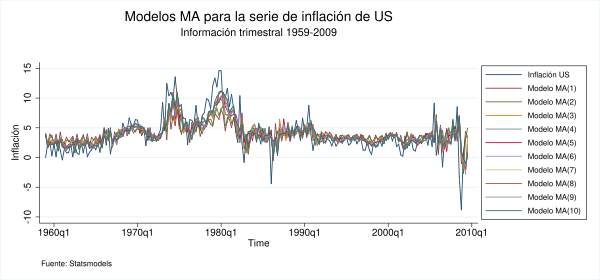

In [30]:
tsline infl MAprediction_*,  ///
title("Modelos MA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(pos(3) col(1) size(small))

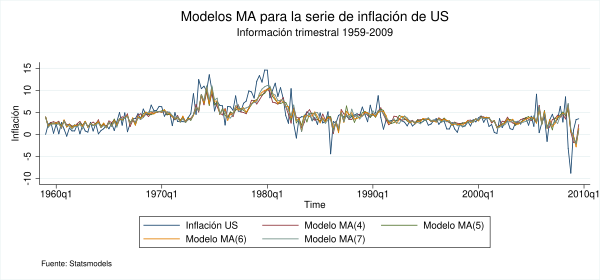

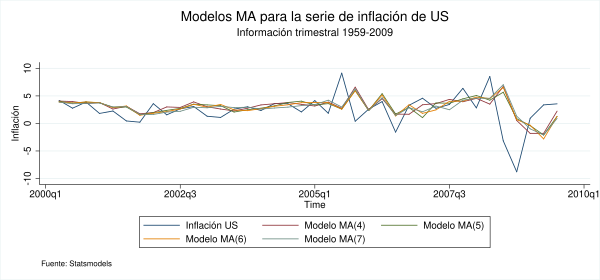

In [34]:
tsline infl MAprediction_1to4 MAprediction_1to5 MAprediction_1to6 MAprediction_1to7,  ///
title("Modelos MA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))

//Podemos tener una vista mas cercana de los modelos indicandole a stata el período
//que queremos graficar. Por ejemplo, a partir de 2000q1 agregando 
// "if time>tq(2000q1)" al código anterior

tsline infl MAprediction_1to4 MAprediction_1to5 MAprediction_1to6 MAprediction_1to7 if time>tq(2000q1),  ///
title("Modelos MA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))

__Pronóstico con un modelo MA__

In [35]:
//Primero debemos generar las nuevas celdas en la base
tsappend, last(2010q4) tsfmt(tq)    // Generate out of sample data observations
des




Contains data
  obs:           208                          
 vars:            45                          
 size:        30,160                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
quarter         byte    %8.0g                 
realgdp         float   %9.0g                 
realcons        float   %9.0g                 
realinv         float   %9.0g                 
realgovt        float   %9.0g                 
realdpi         float   %9.0g                 
cpi             float   %9.0g                 
m1              float   %9.0g                 
tbilrate        float   %9.0g                 
unemp           float   %9.0g                 
pop             float   %9.0g                 
infl          

In [36]:
//Luego estimamos el modelo
arima infl if time<=tq(2009q3), ma(1/5)
predict forecast_MA5, y                        // One-step-ahead forecast (check also: option, xb)
predict dforecast_MA5, dynamic(tq(2009q3)) y




(setting optimization to BHHH)
Iteration 0:   log likelihood = -469.87692  
Iteration 1:   log likelihood = -461.89825  
Iteration 2:   log likelihood = -461.88549  
Iteration 3:   log likelihood =   -460.873  
Iteration 4:   log likelihood =  -460.8627  
(switching optimization to BFGS)
Iteration 5:   log likelihood = -460.76273  
Iteration 6:   log likelihood =  -460.6664  
Iteration 7:   log likelihood =  -460.6658  
Iteration 8:   log likelihood = -460.66569  
Iteration 9:   log likelihood = -460.66567  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(5)      =     130.16
Log likelihood = -460.6657                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+--------------------

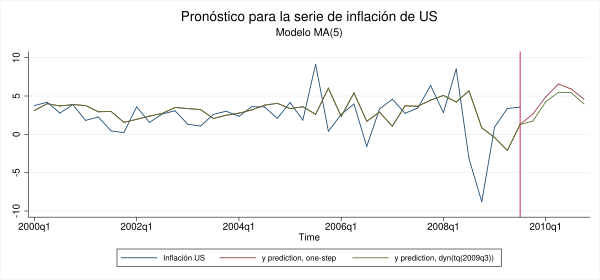

In [40]:
//Grafico del pronóstico 
//Solo se grafican los datos desde 2000q1 para una mejor apreciación
tsline infl forecast_MA5 dforecast_MA5 if time>=tq(2000q1), tline(2009q3) ///
      title("Pronóstico para la serie de inflación de US", color(black)) ///
      subtitle("Modelo MA(5)" " ", size(medium) color(black)) ///
      graphregion(fcolor(white)) xsize(15) ysize(7) legend(col(3) size(small))

*list infl forecast_MA5 dforecast_MA5 if time>=tq(2000q1)

In [41]:
//Intervalos de confianza
predict mse, mse                               
gen up= forecast_MA5+invnormal(.95)*mse                     
gen down= forecast_MA5-invnormal(.95)*mse

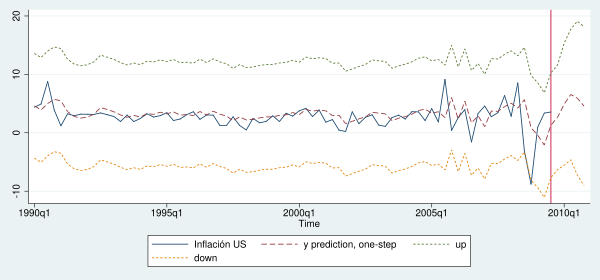

In [44]:
tsline infl forecast_MA5 up down  if time>=tq(1990q1), tline(2009q3) ///
lpattern (solid dash shortdash shortdash) ///
xsize(15) ysize(7) legend(col(3))


In [57]:
//Error de prediccion
gen forecast= forecast_MA5*-1
egen errorma5= rowtotal(infl forecast)



     +-------------------------------+
     |  infl   forecas~5    errorma5 |
     |-------------------------------|
196. |  6.38    4.465683    1.914318 |
197. |  2.82    5.074673   -2.254673 |
198. |  8.53    4.223249    4.306751 |
199. | -3.16    5.676002   -8.836001 |
200. | -8.79    .8583242   -9.648324 |
     |-------------------------------|
201. |   .94   -.4085027    1.348503 |
202. |  3.37   -2.101194    5.471193 |
203. |  3.56    1.290354    2.269646 |
204. |     .    2.649271   -2.649271 |
205. |     .    4.884383   -4.884383 |
     |-------------------------------|
206. |     .    6.560843   -6.560843 |
207. |     .    5.915825   -5.915825 |
208. |     .    4.571786   -4.571786 |
     +-------------------------------+


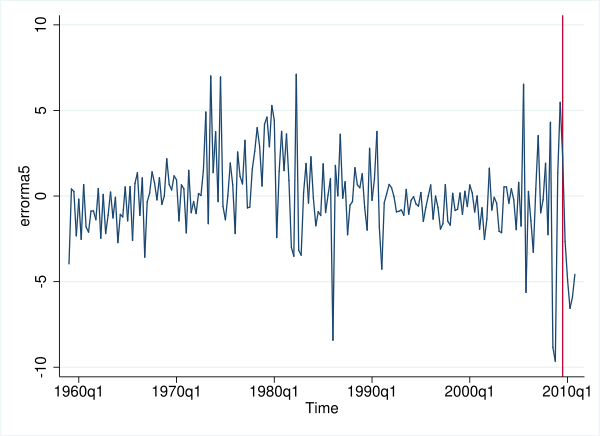

In [58]:
list infl forecast_MA5 errorma5 in 196/208
tsline errorma5,  tline(2009q3) graphregion(fcolor(white))

__Modelo Autorregresivo (AR)__

In [62]:
*drop in 204/208
arima infl, ar(1)              // by MLE
arima infl, arima(1,0,0)       // by MLE



(setting optimization to BHHH)
Iteration 0:   log likelihood = -472.71755  
Iteration 1:   log likelihood = -472.71386  
Iteration 2:   log likelihood = -472.71373  
Iteration 3:   log likelihood = -472.71371  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(1)      =     271.79
Log likelihood = -472.7137                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.923105    .494103     7.94   0.000     2.954681    4.891529
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |    .644145   .0390719    16.49   0.000  

In [ ]:
//Choosing the best specification
ac infl
pac infl



(setting optimization to BHHH)
Iteration 0:   log likelihood = -453.57466  
Iteration 1:   log likelihood = -453.55914  
Iteration 2:   log likelihood = -453.55675  
Iteration 3:   log likelihood =  -453.5563  
Iteration 4:   log likelihood =  -453.5562  
(switching optimization to BFGS)
Iteration 5:   log likelihood = -453.55618  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(3)      =     292.49
Log likelihood = -453.5562                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |    3.80952   .9450895     4.03   0.000     1.957178    5.661861
-------------+---------------------------

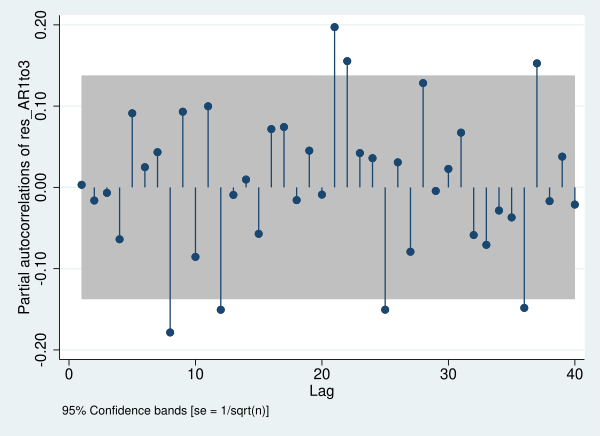






                                          -1       0       1 -1       0       1
 LAG       AC       PAC      Q     Prob>Q  [Autocorrelation]  [Partial Autocor]
-------------------------------------------------------------------------------
1        0.0031   0.0032   .00194  0.9649          |                  |        
2       -0.0158  -0.0162   .05335  0.9737          |                  |        
3       -0.0064  -0.0067   .06178  0.9960          |                  |        
4       -0.0540  -0.0638    .6718  0.9548          |                  |        
5        0.0730   0.0912   1.7908  0.8773          |                  |        
6        0.0087   0.0249   1.8067  0.9366          |                  |        
7        0.0323   0.0433   2.0284  0.9583          |                  |        
8       -0.1206  -0.1785   5.1332  0.7433          |                 -|        
9        0.0739   0.0931    6.306  0.7089          |                  |        
10      -0.0647  -0.0855   7.2097  

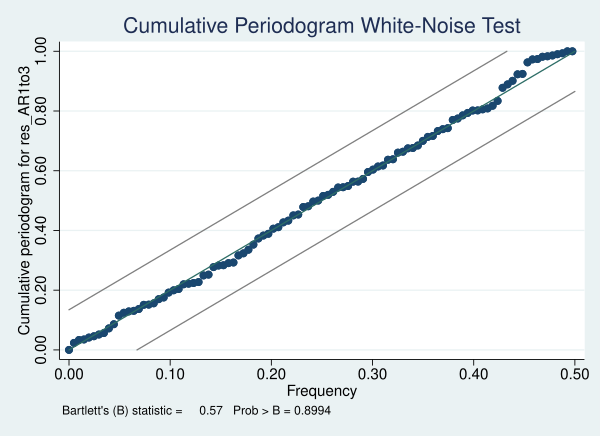

In [63]:
//Modelo AR(3)
arima infl, ar(1/3)
predict ARprediction
predict res_AR1to3, resid
pac res_AR1to3
corrgram res_AR1to3, lags(20)        //No hay autocorrelacion. Estructura aparentemente suficiente.
sktest res_AR1to3
wntestb res_AR1to3

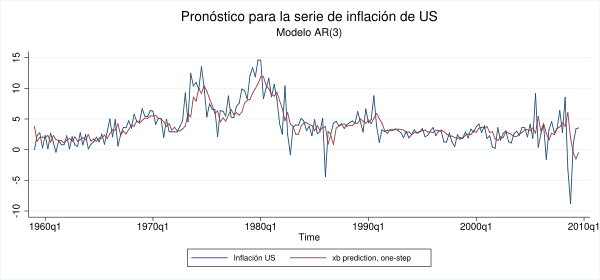

In [69]:
tsline infl ARprediction,  ///
      title("Pronóstico para la serie de inflación de US", color(black)) ///
      subtitle("Modelo AR(3)" " ", size(medium) color(black)) ///
      graphregion(fcolor(white)) xsize(15) ysize(7) legend(col(3) size(small))
      *no se ajusta adecuadamente a la serie



ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(1)      =     271.79
Log likelihood = -472.7137                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.923105    .494103     7.94   0.000     2.954681    4.891529
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |    .644145   .0390719    16.49   0.000     .5675654    .7207245
-------------+----------------------------------------------------------------
      /sigma |   2.480061   .0800526    30.98   0.000     2.323161    2.636961
------------------------------

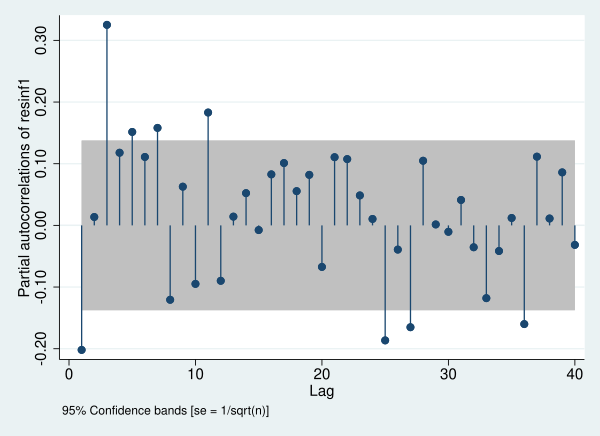

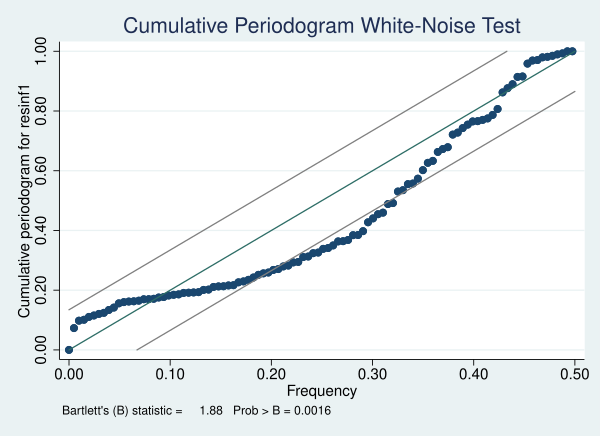


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(2)      =     277.82
Log likelihood = -462.4194                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |    3.88649   .7017546     5.54   0.000     2.511076    5.261904
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |      .4431   .0381011    11.63   0.000     .3684232    .5177767
         L2. |   .3104324   .0412666     7.52   0.000     .2295514    .3913135
-------------+----------------------------------------------------------------
      /sigma |   2.356293   .07

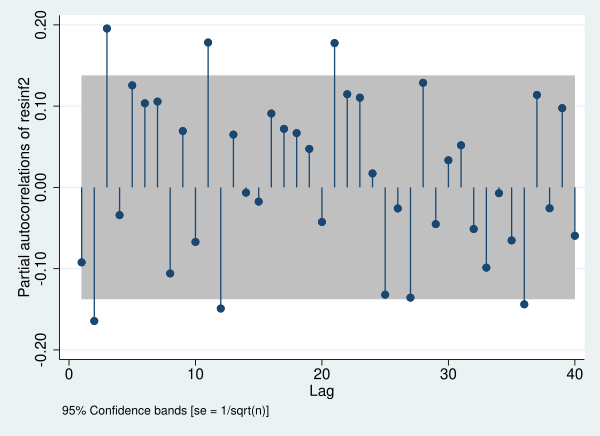

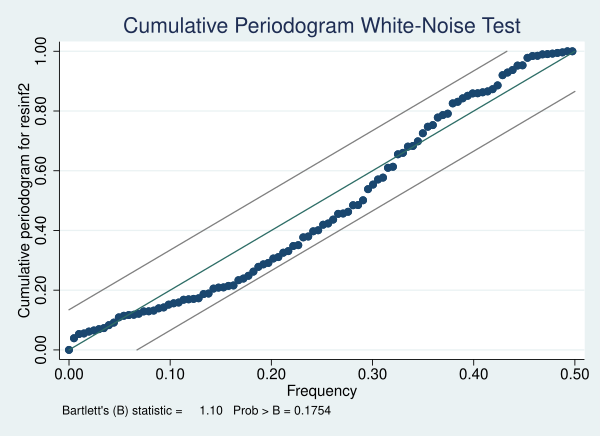


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(3)      =     292.49
Log likelihood = -453.5562                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |    3.80952   .9450895     4.03   0.000     1.957178    5.661861
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |    .352032   .0473088     7.44   0.000     .2593085    .4447554
         L2. |   .1821985   .0474661     3.84   0.000     .0891666    .2752305
         L3. |   .2890311   .0635375     4.55   0.000        .1645    .4135623
-------------+-----------------

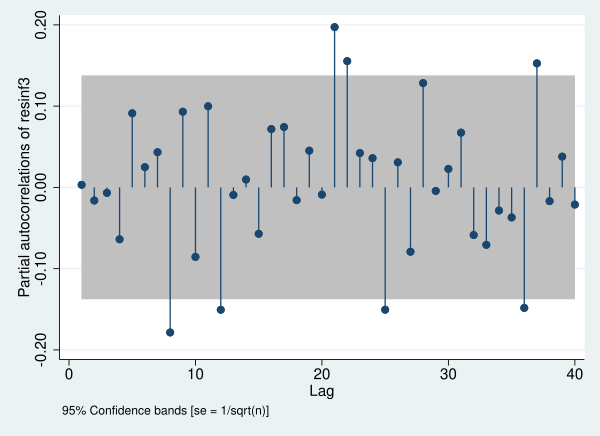

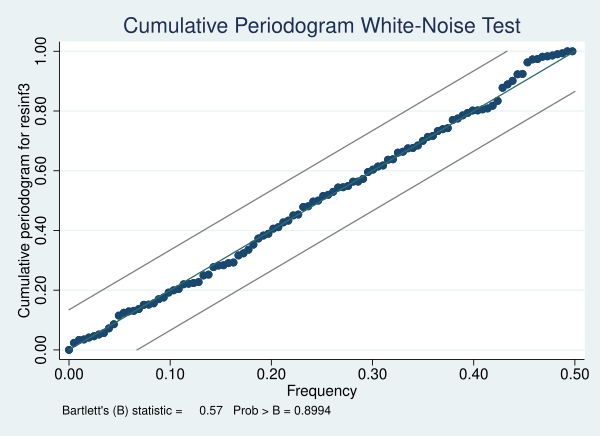


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(4)      =     300.92
Log likelihood = -453.4995                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.828331   .9707198     3.94   0.000     1.925755    5.730907
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |   .3596899   .0471454     7.63   0.000     .2672867    .4520931
         L2. |   .1868085   .0475819     3.93   0.000     .0935497    .2800674
         L3. |   .2974239   .0678888     4.38   0.000     .1643642    .4304836
         L4. |  -.0253401   .05

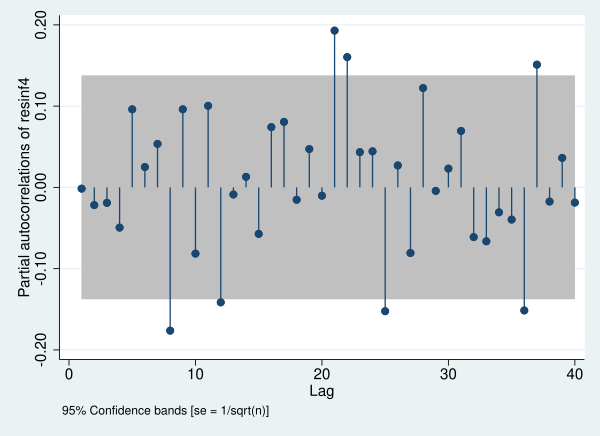

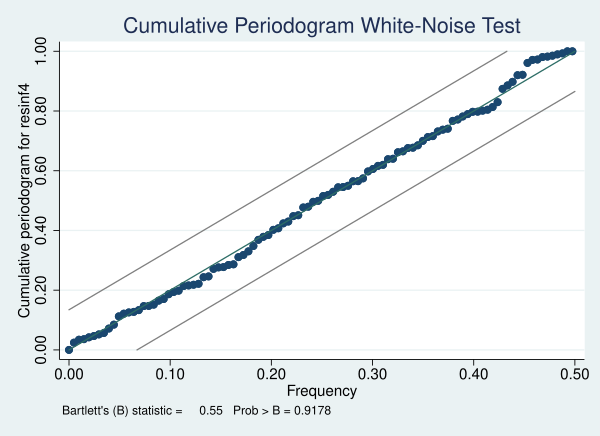

In [70]:
// Proceso iterativo para probar más modelos
forvalues i=1/4{
eststo modeloAR`i': arima infl, ar(1/`i') nolog
predict ARprediction`i' 
predict resinf`i', resid
pac resinf`i'
wntestb resinf`i'
}

In [71]:
sktest resinf*
estimates stats modeloAR*



                    Skewness/Kurtosis tests for Normality
                                                          ------ joint ------
    Variable |        Obs  Pr(Skewness)  Pr(Kurtosis) adj chi2(2)   Prob>chi2
-------------+---------------------------------------------------------------
     resinf1 |        203     0.1802        0.0000       16.37         0.0003
     resinf2 |        203     0.0004        0.0000       27.95         0.0000
     resinf3 |        203     0.0001        0.0000       32.71         0.0000
     resinf4 |        203     0.0001        0.0000       31.94         0.0000


Akaike's information criterion and Bayesian information criterion

-----------------------------------------------------------------------------
       Model |        Obs  ll(null)  ll(model)      df         AIC        BIC
-------------+---------------------------------------------------------------
   modeloAR1 |        203         .  -472.7137       3    951.4274    961.367
   modeloAR2 

In [72]:
label var ARprediction1 "Modelo AR(1)"
label var ARprediction2 "Modelo AR(2)"
label var ARprediction3 "Modelo AR(3)"
label var ARprediction4 "Modelo AR(4)"


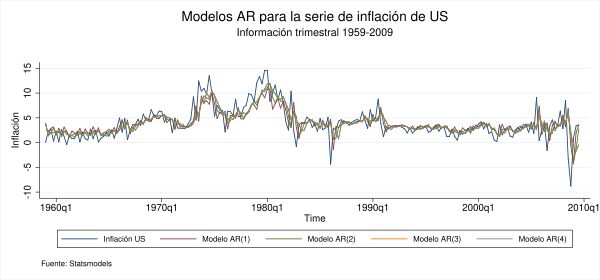

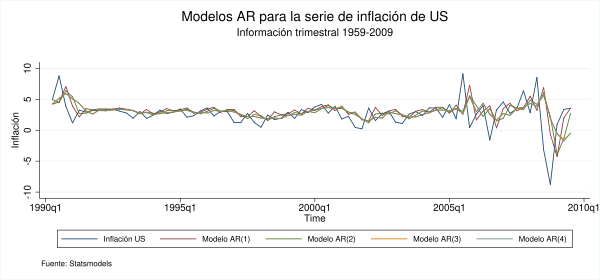

In [77]:
tsline infl ARprediction1 ARprediction2 ARprediction3 ARprediction4,  ///
title("Modelos AR para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(5) size(small))

tsline infl ARprediction1 ARprediction2 ARprediction3 ARprediction4 if time>tq(1990q1),  ///
title("Modelos AR para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(5) size(small))

__Pronóstico con un modelo AR__

In [78]:
//out of sample forecast
tsappend, last(2010q4) tsfmt(tq)         // Generate out of sample data observations
describe




Contains data
  obs:           208                          
 vars:            72                          
 size:        50,128                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
quarter         byte    %8.0g                 
realgdp         float   %9.0g                 
realcons        float   %9.0g                 
realinv         float   %9.0g                 
realgovt        float   %9.0g                 
realdpi         float   %9.0g                 
cpi             float   %9.0g                 
m1              float   %9.0g                 
tbilrate        float   %9.0g                 
unemp           float   %9.0g                 
pop             float   %9.0g                 
infl          

In [79]:
forvalues i=1/4{
arima infl if tin(, 2009q3), ar(1/`i')     
predict forecast_AR1to`i', y
predict dforecastAR`i', dynamic(tq(2009q3)) y
}



(setting optimization to BHHH)
Iteration 0:   log likelihood = -472.71755  
Iteration 1:   log likelihood = -472.71386  
Iteration 2:   log likelihood = -472.71373  
Iteration 3:   log likelihood = -472.71371  

ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(1)      =     271.79
Log likelihood = -472.7137                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.923105    .494103     7.94   0.000     2.954681    4.891529
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |    .644145   .0390719    16.49   0.000  

In [81]:
list time infl forecast_AR1to1 forecast_AR1to2 forecast_AR1to3 forecast_AR1to4 if time>=tq(2000q1)


     +----------------------------------------------------------------+
     |   time    infl   forecas~1   forecas~2   forecas~3   forecas~4 |
     |----------------------------------------------------------------|
165. | 2000q1    3.76     3.23187    3.260677    2.841884    2.843019 |
166. | 2000q2    4.19    3.818042    3.508682    3.484449    3.527083 |
167. | 2000q3    2.77    4.095024    3.981709    3.657107    3.666797 |
168. | 2000q4    3.89    3.180338    3.485993    3.498586    3.519691 |
169. | 2001q1    1.82    3.901781    3.541451    3.758423    3.762108 |
     |----------------------------------------------------------------|
170. | 2001q2    2.26      2.5684    2.971918    2.823355    2.793537 |
171. | 2001q3     .45    2.851824    2.524287    2.924813    2.934205 |
172. | 2001q4     .23    1.685922    1.858866    1.769508    1.721313 |
173. | 2002q1    3.59     1.54421    1.199502    1.489455    1.487379 |
174. | 2002q2    1.56    3.708537    2.620022    2.109053    2.

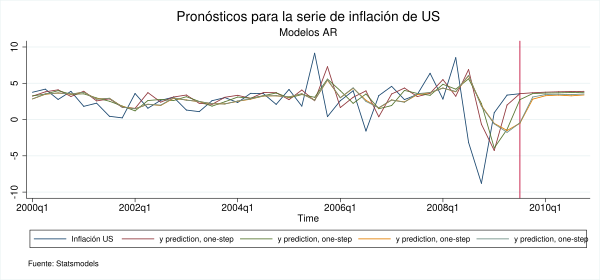

In [82]:
tsline infl forecast_AR1to1 forecast_AR1to2 forecast_AR1to3 forecast_AR1to4 if time>=tq(2000q1), ///
tline(2009q3) title("Pronósticos para la serie de inflación de US", color(black)) ///
subtitle("Modelos AR", size(medium) color(black)) note(" " "Fuente: Statsmodels", size(small)) /// 
xsize(15) ysize(7) legend(col(5) size(small)) graphregion(fcolor(white))

__Modelo ARMA__

In [87]:
//Modelo ARMA(1,3)
arima infl, ar(1/3) ma(1/5) nolog
arima infl, ar(1/3) ma(1/4) nolog
arima infl, ar(1) ma(1/4) nolog



ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(8)      =   16913.03
Log likelihood =  -450.077                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.774076   1.061173     3.56   0.000     1.694215    5.853936
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |  -.7345971   .5957054    -1.23   0.218    -1.902158    .4329639
         L2. |   .8478687   .0774599    10.95   0.000     .6960501    .9996873
         L3. |   .6055863   .4911742     1.23   0.218    -.3570974     1.56827
             |
          ma |



(5 observations deleted)


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(2)      =    1149.70
Log likelihood = -456.0756                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.692803   1.121199     3.29   0.001     1.495292    5.890313
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |   .9339654   .0299564    31.18   0.000     .8752519    .9926788
             |
          ma |
         L1. |  -.5754491   .0545177   -10.56   0.000    -.6823019   -.4685963
-------------+---------------------------------------

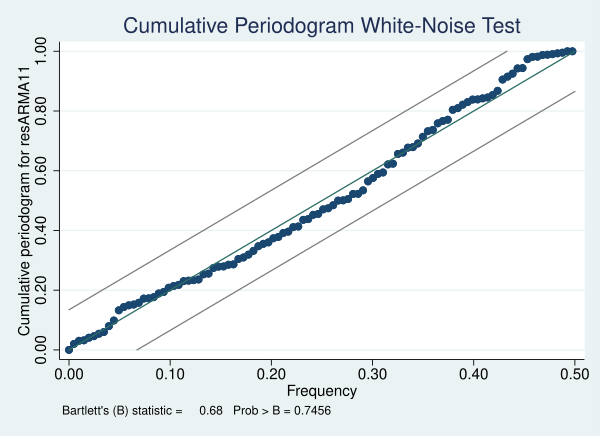


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(4)      =     561.57
Log likelihood = -451.9847                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.685158   1.147003     3.21   0.001     1.437074    5.933243
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |   .0366172    .055446     0.66   0.509     -.072055    .1452893
         L2. |   .8433094   .0412642    20.44   0.000     .7624331    .9241857
             |
          ma |
         L1. |   .4022619   41.45547     0.01   0.992    -80.84897     81.6535
 

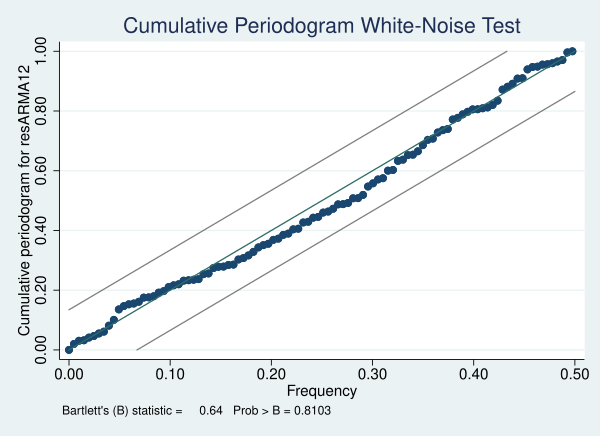


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(6)      =     373.35
Log likelihood =  -450.954                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.772597   1.048718     3.60   0.000     1.717148    5.828047
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |   .1414662   .4530164     0.31   0.755    -.7464296    1.029362
         L2. |   .6702296   .1087424     6.16   0.000     .4570985    .8833607
         L3. |   .0337549    .363389     0.09   0.926    -.6784744    .7459843
             |
          ma |
 

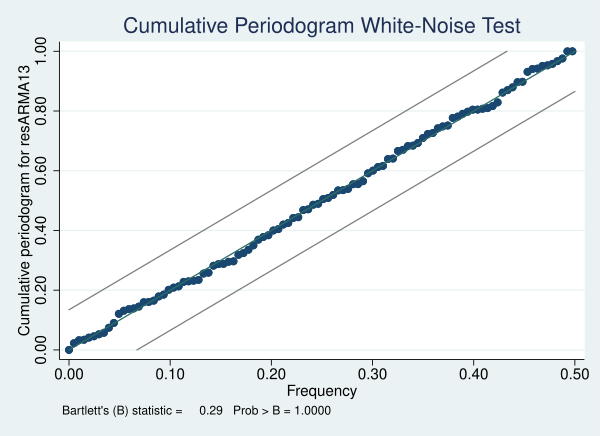


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(8)      =     142.62
Log likelihood = -449.6011                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |    3.74377   1.088406     3.44   0.001     1.610534    5.877007
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |  -.3856934   .1615889    -2.39   0.017    -.7024019   -.0689849
         L2. |  -.0093155     .11567    -0.08   0.936    -.2360246    .2173935
         L3. |   .3763743   .1203402     3.13   0.002     .1405118    .6122368
         L4. |   .7069613   .12

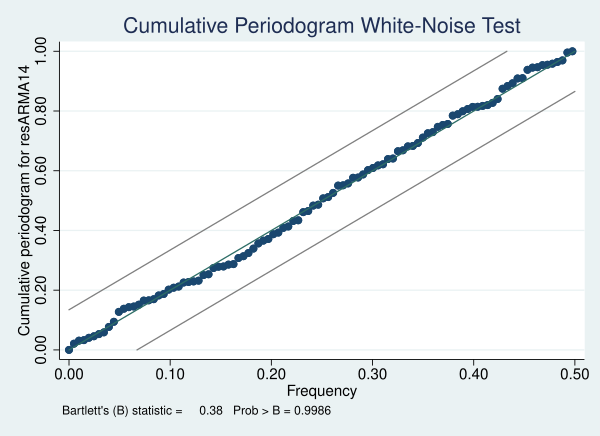


ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(8)      =    7931.55
Log likelihood = -446.5688                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.767135   1.063822     3.54   0.000     1.682081    5.852188
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |  -1.558124    .551744    -2.82   0.005    -2.639522   -.4767253
         L2. |  -.3429448   .7757804    -0.44   0.658    -1.863446    1.177557
         L3. |   1.158891    .115298    10.05   0.000      .932911    1.384871
         L4. |   .9905481   .68

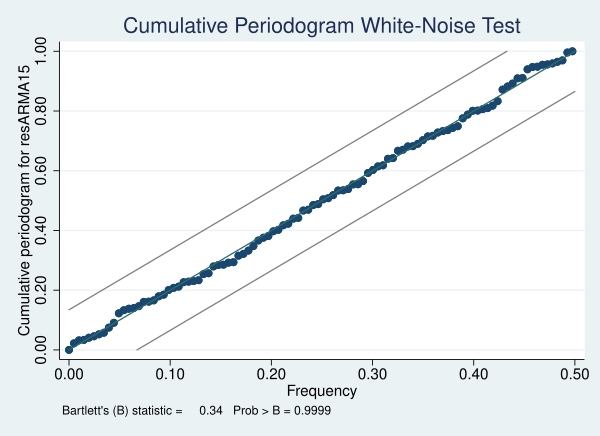

In [88]:
*drop in 204/208

forvalues i=1(1)5{
eststo ARMA`i': arima infl, ar(1/`i') ma(1/`i') nolog
predict modeloARMA1`i'
predict resARMA1`i', resid
wntestb resARMA1`i'
//corrgram res1to`i', lags(20)
//ac res1to`i'
}


In [89]:
sktest resARMA1*                 
estimates stats ARMA* 
//El modelo con menor pérdida de información es el ARMA(1,1)



                    Skewness/Kurtosis tests for Normality
                                                          ------ joint ------
    Variable |        Obs  Pr(Skewness)  Pr(Kurtosis) adj chi2(2)   Prob>chi2
-------------+---------------------------------------------------------------
   resARMA11 |        203     0.0000        0.0000       34.92         0.0000
   resARMA12 |        203     0.0002        0.0000       29.92         0.0000
   resARMA13 |        203     0.0004        0.0000       30.07         0.0000
   resARMA14 |        203     0.0001        0.0000       33.00         0.0000
   resARMA15 |        203     0.0002        0.0000       30.58         0.0000


Akaike's information criterion and Bayesian information criterion

-----------------------------------------------------------------------------
       Model |        Obs  ll(null)  ll(model)      df         AIC        BIC
-------------+---------------------------------------------------------------
       ARMA1 

In [90]:
label var modeloARMA11 "Modelo ARMA(1,1)"
label var modeloARMA12 "Modelo ARMA(2,2)"
label var modeloARMA13 "Modelo ARMA(3,3)"
label var modeloARMA14 "Modelo ARMA(4,4)"
label var modeloARMA15 "Modelo ARMA(5,5)"

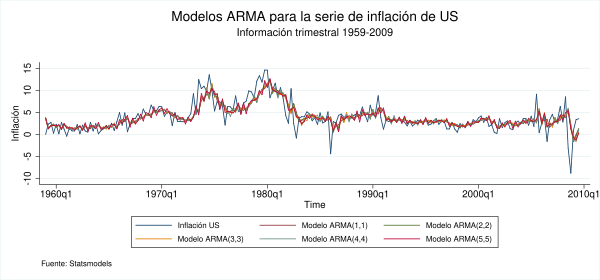

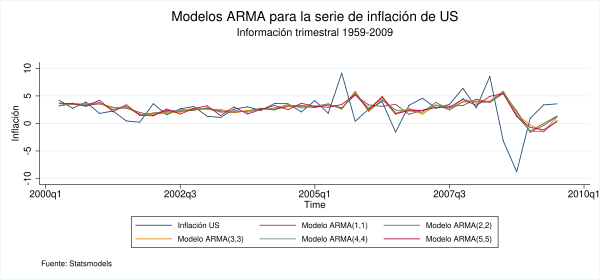

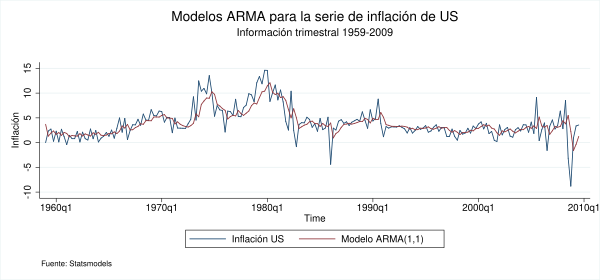

In [94]:
tsline infl modeloARMA*,  ///
title("Modelos ARMA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))

tsline infl modeloARMA* if time>tq(2000q1),  ///
title("Modelos ARMA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))

tsline infl modeloARMA11,  ///
title("Modelos ARMA para la serie de inflación de US", color(black)) ///
subtitle(" Información trimestral 1959-2009" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3))

__Pronóstico con modelos ARMA__

In [95]:
//out of sample forecast
tsappend, last(2010q4) tsfmt(tq)         // Generate out of sample data observations
describe




Contains data
  obs:           208                          
 vars:            95                          
 size:        66,144                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
quarter         byte    %8.0g                 
realgdp         float   %9.0g                 
realcons        float   %9.0g                 
realinv         float   %9.0g                 
realgovt        float   %9.0g                 
realdpi         float   %9.0g                 
cpi             float   %9.0g                 
m1              float   %9.0g                 
tbilrate        float   %9.0g                 
unemp           float   %9.0g                 
pop             float   %9.0g                 
infl          

In [102]:
forvalues i=1/5{
arima infl, ar(1/`i') ma(1/`i') nolog   
predict forecast_ARMA`i'_`i', y
predict dforecastARMA`i'_`i', dynamic(tq(2009q3)) y
}



ARIMA regression

Sample:  1959q1 - 2009q3                        Number of obs     =        203
                                                Wald chi2(2)      =    1149.70
Log likelihood = -456.0756                      Prob > chi2       =     0.0000

------------------------------------------------------------------------------
             |                 OPG
        infl |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
infl         |
       _cons |   3.692803   1.121199     3.29   0.001     1.495292    5.890313
-------------+----------------------------------------------------------------
ARMA         |
          ar |
         L1. |   .9339654   .0299564    31.18   0.000     .8752519    .9926788
             |
          ma |
         L1. |  -.5754491   .0545177   -10.56   0.000    -.6823019   -.4685963
-------------+----------------------------------------------------------------


In [103]:
label var forecast_ARMA1_1 "Modelo ARMA(1,1)"
label var forecast_ARMA2_2 "Modelo ARMA(2,2)"
label var forecast_ARMA3_3 "Modelo ARMA(3,3)"
label var forecast_ARMA4_4 "Modelo ARMA(4,4)"
label var forecast_ARMA5_5 "Modelo ARMA(5,5)"

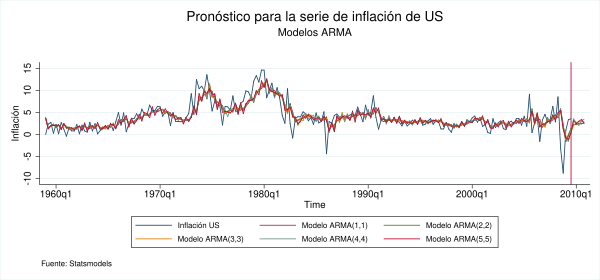

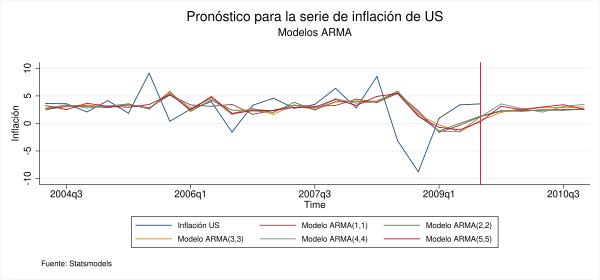

In [106]:
tsline infl forecast_ARMA*, tline(2009q3) ///
title("Pronóstico para la serie de inflación de US", color(black)) ///
subtitle("Modelos ARMA" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))

tsline infl forecast_ARMA* if time>tq(2004q1), tline(2009q3) ///
title("Pronóstico para la serie de inflación de US", color(black)) ///
subtitle("Modelos ARMA" " " " ", size(medium) color(black)) ///
note(" " "Fuente: Statsmodels", size(small)) /// 
yti("Inflación", height(4)) graphregion(fcolor(white)) ///
xsize(15) ysize(7) legend(col(3) size(small))